In [1456]:
import pandas as pd #CSV LOADING

In [1457]:
test_Data = pd.read_csv('spotify_train.csv')
train_Data = pd.read_csv('spotify_test.csv')

spotify_Data = pd.concat(map(pd.read_csv, ['spotify_train.csv', 'spotify_test.csv']), ignore_index = True)


In [1458]:
spotify_Data = spotify_Data.sort_values(["artist","name"],ascending = (True , True))
spotify_Data.to_csv('spotify.csv',index=False)

In [1459]:
spotify_Data.describe(include='all')

,id,artist_id,artist,name,popularity,release_date,duration_ms,explicit,danceability,energy,...,valence,tempo,artist_genres,artist_followers,url,playlist_id,playlist_description,playlist_name,playlist_url,query
count,53669,53669,53669,53669,53669.000000,53669,5.366900e+04,53669,53669.000000,53669.000000,...,53669.000000,53669.000000,53669,5.366800e+04,53669,53669,37150,53643,53669,53669
unique,53669,14034,14008,45074,NaN,7216,NaN,2,NaN,NaN,...,NaN,NaN,9414,NaN,53669,1046,722,1027,1046,17
top,6PR3ZUCnxtQTEu30qgZLwT,1dfeR4HaWDbWqFHLkxsg1d,Queen,Home,NaN,2012-01-01,NaN,False,NaN,NaN,...,NaN,NaN,"['classic rock', 'glam rock', 'rock']",NaN,https://open.spotify.com/track/3q4JF2Hj5Mi9Onl...,7kJGGpsFEHD7oS87nBBQJJ,"Quality orchestral music from movies, TV serie...",Quality Drum & Bass,https://open.spotify.com/playlist/7kJGGpsFEHD7...,spotify_user
freq,1,531,531,24,NaN,312,NaN,46607,NaN,NaN,...,NaN,NaN,531,NaN,1,100,353,242,100,13852
mean,NaN,NaN,NaN,NaN,35.375058,NaN,2.410662e+05,NaN,0.551036,0.598210,...,0.449892,121.211188,NaN,3.050833e+06,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,23.617331,NaN,1.024195e+05,NaN,0.187554,0.277445,...,0.264206,30.830377,NaN,7.878787e+06,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000000,NaN,1.117300e+04,NaN,0.000000,0.000280,...,0.000000,0.000000,NaN,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,15.000000,NaN,1.870130e+05,NaN,0.428000,0.413000,...,0.227000,96.211000,NaN,4.703200e+04,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,39.000000,NaN,2.243060e+05,NaN,0.564000,0.654000,...,0.436000,120.054000,NaN,3.941030e+05,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,54.000000,NaN,2.716260e+05,NaN,0.690000,0.829000,...,0.661000,140.076000,NaN,2.140548e+06,NaN,NaN,NaN,NaN,NaN,NaN


In [1460]:
from sklearn.preprocessing import MultiLabelBinarizer
import numpy as np
genres = spotify_Data['artist_genres'].to_list()
genres = [i.replace("'", "") for i in genres]
genres = [i.replace(", ", ",") for i in genres]

all_genres = []

for example in genres:
    example = example[1:-1]
    example_list = example.split(',')
    for genre in example_list:
        all_genres.append(genre)
original_genres = list(set(all_genres))
print("Pocet originalnych zanrov :",len(original_genres))

Pocet originalnych zanrov : 3130


In [1491]:
from collections import Counter

print("Top 20 najviac vyskutujucich sa zanrov:")
Counter(all_genres).most_common(20)

Top 20 najviac vyskutujucich sa zanrov:


[('rock', 6316),
 ('pop', 5089),
 ('dance pop', 3960),
 ('classic rock', 3412),
 ('classical', 3253),
 ('rap', 2177),
 ('modern rock', 2139),
 ('mellow gold', 2087),
 ('hip hop', 1979),
 ('album rock', 1954),
 ('permanent wave', 1833),
 ('alternative metal', 1773),
 ('edm', 1743),
 ('pop rap', 1713),
 ('soft rock', 1683),
 ('hard rock', 1640),
 ('alternative rock', 1598),
 ('pop rock', 1551),
 ('r&b', 1489),
 ('urban contemporary', 1386)]

In [1462]:
print("Top 20 najviac vyskutujucich sa hudobnikov:")
Counter(spotify_Data['artist'].to_list()).most_common(20)

Top 20 najviac vyskutujucich sa hudobnikov:


[('Queen', 531),
 ('Wolfgang Amadeus Mozart', 240),
 ('Ludwig van Beethoven', 227),
 ('Johann Sebastian Bach', 216),
 ('Taylor Swift', 186),
 ('The Beatles', 184),
 ('Status Quo', 179),
 ('Vitamin String Quartet', 153),
 ('Metallica', 145),
 ('Nicki Minaj', 131),
 ('Antonio Vivaldi', 130),
 ('Claude Debussy', 130),
 ('Selena', 120),
 ('Aretha Franklin', 110),
 ('Kanye West', 108),
 ('John Williams', 106),
 ('Franz Schubert', 104),
 ('Erik Satie', 102),
 ('Nick Neblo', 100),
 ('Madonna', 99)]

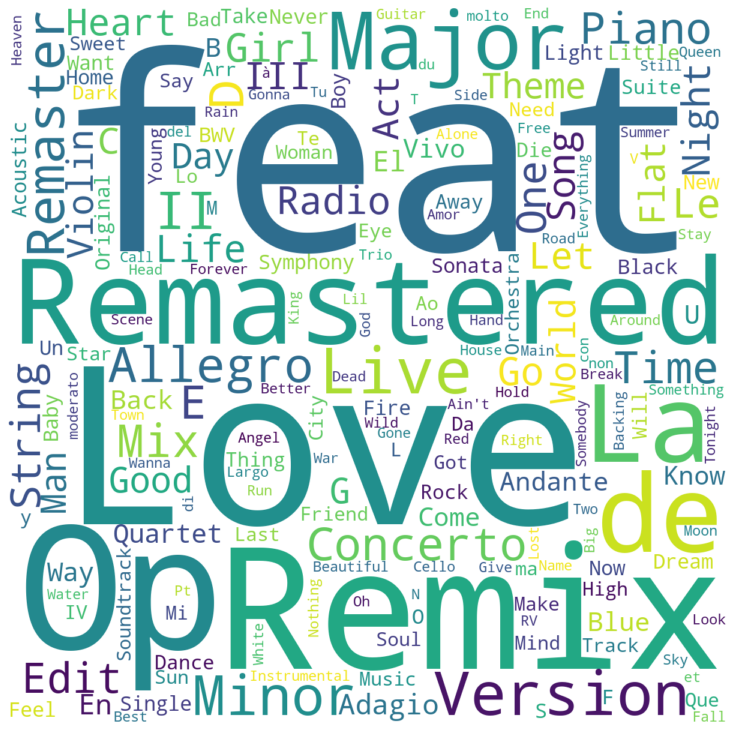

In [1463]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
fields = ['name']
text = pd.read_csv('spotify.csv', usecols=fields)
wordcloud = WordCloud(background_color="white", width=1200, height=1200,collocations=False).generate(' '.join(text['name']))
plt.figure(figsize=(10, 10))
plt.axis("off")
plt.tight_layout(pad=0)
plt.imshow(wordcloud, interpolation='bilinear')
plt.show()


In [1464]:
spotify_Data.info()
spotify_Data.isnull().sum()
spotify_Data.nunique()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53669 entries, 22173 to 24137
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    53669 non-null  object 
 1   artist_id             53669 non-null  object 
 2   artist                53669 non-null  object 
 3   name                  53669 non-null  object 
 4   popularity            53669 non-null  int64  
 5   release_date          53669 non-null  object 
 6   duration_ms           53669 non-null  int64  
 7   explicit              53669 non-null  bool   
 8   danceability          53669 non-null  float64
 9   energy                53669 non-null  float64
 10  key                   53669 non-null  int64  
 11  loudness              53669 non-null  float64
 12  mode                  53669 non-null  int64  
 13  speechiness           53669 non-null  float64
 14  acousticness          53669 non-null  float64
 15  instrumentalnes

id                      53669
artist_id               14034
artist                  14008
name                    45074
popularity                100
release_date             7216
duration_ms             32738
explicit                    2
danceability             1161
energy                   2193
key                        12
loudness                18363
mode                        2
speechiness              1312
acousticness             4445
instrumentalness         5242
liveness                 1684
valence                  1636
tempo                   34458
artist_genres            9414
artist_followers        13283
url                     53669
playlist_id              1046
playlist_description      722
playlist_name            1027
playlist_url             1046
query                      17
dtype: int64

In [1465]:
display(spotify_Data.describe().round(2))

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,artist_followers
count,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53669.00,53668.00
mean,35.38,241066.19,0.55,0.60,5.25,-9.38,0.62,0.08,0.32,0.19,0.18,0.45,121.21,3050833.05
std,23.62,102419.53,0.19,0.28,3.56,6.38,0.49,0.09,0.35,0.33,0.16,0.26,30.83,7878787.32
min,0.00,11173.00,0.00,0.00,0.00,-44.94,0.00,0.00,0.00,0.00,0.01,0.00,0.00,0.00
25%,15.00,187013.00,0.43,0.41,2.00,-11.16,0.00,0.04,0.02,0.00,0.09,0.23,96.21,47032.00
50%,39.00,224306.00,0.56,0.65,5.00,-7.34,1.00,0.05,0.16,0.00,0.12,0.44,120.05,394103.00
75%,54.00,271626.00,0.69,0.83,8.00,-5.26,1.00,0.09,0.61,0.21,0.22,0.66,140.08,2140548.00
max,100.00,3590693.00,0.99,1.00,11.00,3.11,1.00,0.95,1.00,1.00,1.00,1.00,243.03,86319453.00


In [1466]:
print("Duration_ms - Skewness: %f" %spotify_Data['duration_ms'].skew())
print("Duration_ms - Kurtosis: %f" %spotify_Data['duration_ms'].kurt())
print("Danceability - Skewness: %f" %spotify_Data['danceability'].skew())
print("Danceability - Kurtosis: %f" %spotify_Data['danceability'].kurt())
print("Energy - Skewness: %f" %spotify_Data['energy'].skew())
print("Energy - Kurtosis: %f" %spotify_Data['energy'].kurt())
print("Speechiness - Skewness: %f" %spotify_Data['speechiness'].skew())
print("Speechiness - Kurtosis: %f" %spotify_Data['speechiness'].kurt())
print("Acousticness - Skewness: %f" %spotify_Data['acousticness'].skew())
print("Acousticness - Kurtosis: %f" %spotify_Data['acousticness'].kurt())
print("Instrumentalness - Skewness: %f" %spotify_Data['instrumentalness'].skew())
print("Instrumentalness - Kurtosis: %f" %spotify_Data['instrumentalness'].kurt())
print("Liveness - Skewness: %f" %spotify_Data['liveness'].skew())
print("Liveness - Kurtosis: %f" %spotify_Data['liveness'].kurt())
print("Valence - Skewness: %f" %spotify_Data['valence'].skew())
print("Valence - Kurtosis: %f" %spotify_Data['valence'].kurt())
print("Tempo - Skewness: %f" %spotify_Data['tempo'].skew())
print("Tempo - Kurtosis: %f" %spotify_Data['tempo'].kurt())

Duration_ms - Skewness: 4.430847
Duration_ms - Kurtosis: 54.426558
Danceability - Skewness: -0.324820
Danceability - Kurtosis: -0.411480
Energy - Skewness: -0.568244
Energy - Kurtosis: -0.743777
Speechiness - Skewness: 2.855191
Speechiness - Kurtosis: 10.505545
Acousticness - Skewness: 0.777687
Acousticness - Kurtosis: -0.948690
Instrumentalness - Skewness: 1.405828
Instrumentalness - Kurtosis: 0.206853
Liveness - Skewness: 2.469334
Liveness - Kurtosis: 7.284349
Valence - Skewness: 0.167848
Valence - Kurtosis: -1.044576
Tempo - Skewness: 0.311734
Tempo - Kurtosis: -0.512993


In [1467]:
train_Data.drop_duplicates(subset=['artist_id','name','duration_ms'],inplace=True)
train_Data = train_Data.drop(columns=['artist', 'name','id','artist_id','url','playlist_id','playlist_description','playlist_name','playlist_url','query'])
test_Data = test_Data.drop(columns=['artist', 'name','id','artist_id','url','playlist_id','playlist_description','playlist_name','playlist_url','query'])

In [1468]:
train_Data['explicit'] = train_Data['explicit'].replace({False: 0, True: 1})
test_Data['explicit'] = test_Data['explicit'].replace({False: 0, True: 1})


train_Data['release_date'] = (train_Data['release_date'].str.slice(stop=4)).apply(pd.to_numeric)
test_Data['release_date'] = (test_Data['release_date'].str.slice(stop=4)).apply(pd.to_numeric)
test_Data = test_Data.dropna(how='any',axis=0) 


genres = ['alternative','classical','country','drum and bass','folk','hip hop','house', 'metal', 'pop', 'rap', 'rock', 'soul', 'trap']
for genre in genres:
    train_Data[genre] = 0
    test_Data[genre] = 0
    spotify_Data[genre] = 0
    train_Data.loc[train_Data['artist_genres'].str.contains(genre),genre] = 1
    test_Data.loc[test_Data['artist_genres'].str.contains(genre),genre] = 1
    spotify_Data.loc[spotify_Data['artist_genres'].str.contains(genre),genre] = 1
train_Data = train_Data.drop(columns=['artist_genres'])
test_Data = test_Data.drop(columns=['artist_genres'])
train_Data.head()

,popularity,release_date,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,...,drum and bass,folk,hip hop,house,metal,pop,rap,rock,soul,trap
0,66,2019,206250,1,0.783,0.789,6,-3.899,0,0.0797,...,0,0,0,1,0,0,0,0,0,0
1,2,2021,308990,0,0.413,0.566,5,-9.404,0,0.0965,...,0,0,0,0,0,0,0,0,0,0
2,46,2017,213900,0,0.634,0.655,11,-7.404,1,0.0286,...,0,0,0,0,0,1,0,0,0,0
3,58,2008,161720,0,0.331,0.961,11,-4.627,1,0.0663,...,0,0,0,0,0,0,0,1,0,0
4,55,2017,149053,0,0.631,0.707,10,-4.601,0,0.1470,...,0,0,1,0,0,0,1,0,0,0


Kovariacna matica


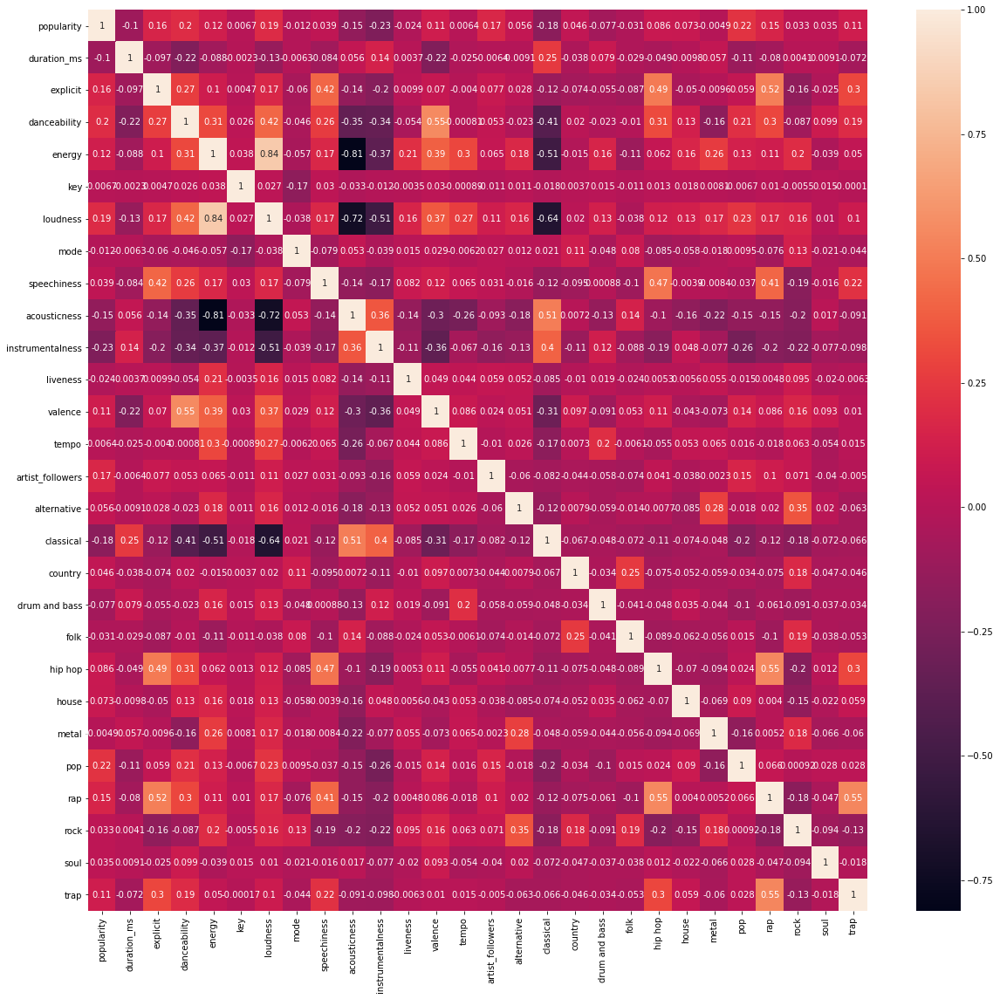

In [1469]:
print("Kovariacna matica")
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(20,19))
hm = sns.heatmap(spotify_Data.corr(), annot = True)
plt.show()

In [1503]:
print ("TOP 5 and BOTTOM 5 in loudness")
column = 'loudness'
spotify_Data = spotify_Data.sort_values([column], ascending = (False))
spotify_Data.loc[:,['artist','name',column,'energy','danceability','valence','acousticness','instrumentalness','classical']]

TOP 5 and BOTTOM 5 in loudness


,artist,name,loudness,energy,danceability,valence,acousticness,instrumentalness,classical
6940,Macky Gee,Games,3.108,0.99300,0.5910,0.1950,0.20900,0.049400,0
51289,Subsonic,Do Your Thang,2.292,0.91200,0.7170,0.7460,0.00109,0.000000,0
30055,Macky Gee,Hoe Talk,2.124,0.99000,0.6640,0.1250,0.01360,0.226000,0
29711,Macky Gee,Try,2.001,0.98000,0.6800,0.6910,0.01950,0.000548,0
797,Levela,Lights,1.858,0.99800,0.6240,0.4750,0.00932,0.859000,0
...,...,...,...,...,...,...,...,...,...
16532,Esa-Pekka Salonen,Violin Concerto: Movement Two: Pulse I,-43.277,0.00219,0.0754,0.0335,0.41100,0.296000,1
8813,Maurice Ravel,"Ma mère l'oye, M. 62: Pavane de la belle au bo...",-43.812,0.00123,0.0921,0.0385,0.82600,0.112000,1
9057,John Cage,Dream,-44.135,0.00154,0.2660,0.0922,0.99300,0.862000,1
43046,Thomas Adès,"Adès: Traced Overhead, Op. 15: I. Sursum",-44.727,0.01500,0.2040,0.0548,0.97800,0.929000,1


Outliers


<Figure size 432x288 with 0 Axes>

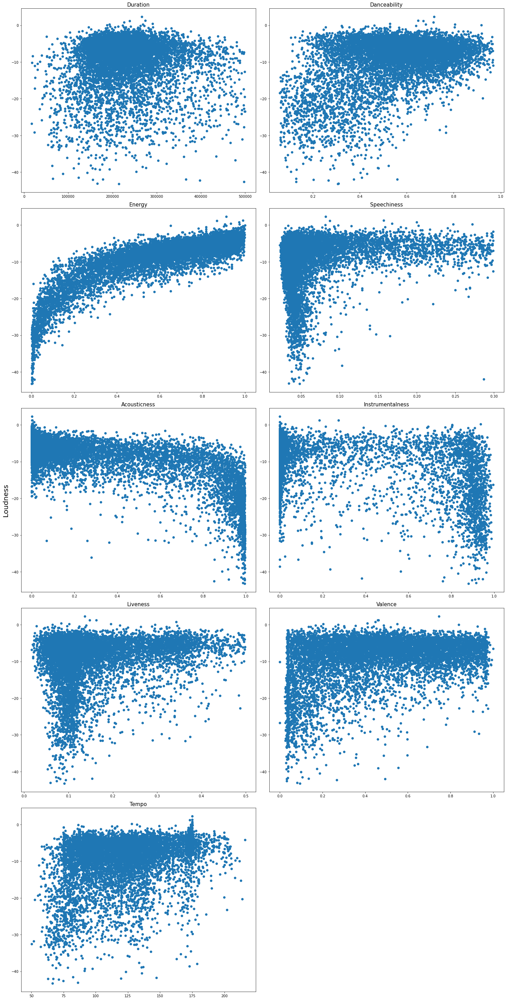

In [1471]:
print("Outliers")
plt.figure(1)
f,axarr = plt.subplots(5,2, figsize = (20,40))
loudnessValues = train_Data.loudness.values

axarr[0,0].scatter(train_Data.duration_ms.values, loudnessValues)
axarr[0,0].set_title('Duration',fontsize=15)

axarr[0,1].scatter(train_Data.danceability.values, loudnessValues)
axarr[0,1].set_title('Danceability',fontsize=15)

axarr[1,0].scatter(train_Data.energy.values, loudnessValues)
axarr[1,0].set_title('Energy',fontsize=15)

axarr[1,1].scatter(train_Data.speechiness.values, loudnessValues)
axarr[1,1].set_title('Speechiness',fontsize=15)

axarr[2,0].scatter(train_Data.acousticness.values, loudnessValues)
axarr[2,0].set_title('Acousticness',fontsize=15)

axarr[2,1].scatter(train_Data.instrumentalness.values, loudnessValues)
axarr[2,1].set_title('Instrumentalness',fontsize=15)

axarr[3,0].scatter(train_Data.liveness.values, loudnessValues)
axarr[3,0].set_title('Liveness',fontsize=15)

axarr[3,1].scatter(train_Data.valence.values, loudnessValues)
axarr[3,1].set_title('Valence',fontsize=15)

axarr[4,0].scatter(train_Data.tempo.values, loudnessValues)
axarr[4,0].set_title('Tempo',fontsize=15)

axarr[4,1].axis("off")

f.text(-0.01, 0.5, 'Loudness', va='center', rotation='vertical', fontsize = 20)
plt.tight_layout()
plt.show()

In [1472]:
print(train_Data.dtypes)

popularity            int64
release_date          int64
duration_ms           int64
explicit              int64
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
artist_followers    float64
alternative           int64
classical             int64
country               int64
drum and bass         int64
folk                  int64
hip hop               int64
house                 int64
metal                 int64
pop                   int64
rap                   int64
rock                  int64
soul                  int64
trap                  int64
dtype: object


In [1473]:
import scipy.stats as stats
print(train_Data.size)
train_Data = train_Data[(np.abs(stats.zscore(train_Data[train_Data.columns.drop('release_date')])) < 5).all(axis=1)]
print(train_Data.size)

256186
240149


Outliers AFTER


<Figure size 432x288 with 0 Axes>

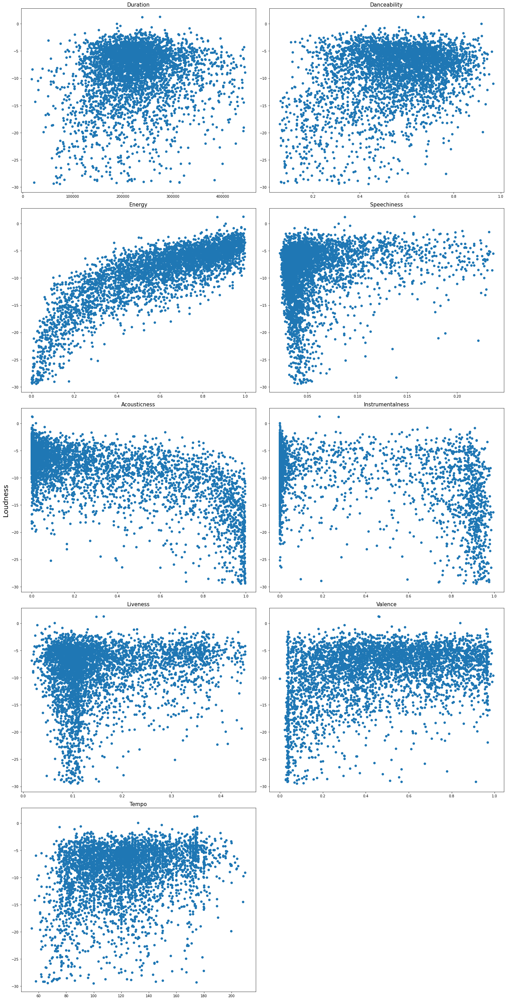

In [1455]:
print("Outliers AFTER")
plt.figure(1)
f,axarr = plt.subplots(5,2, figsize = (20,40))
loudnessValues = train_Data.loudness.values

axarr[0,0].scatter(train_Data.duration_ms.values, loudnessValues)
axarr[0,0].set_title('Duration',fontsize=15)

axarr[0,1].scatter(train_Data.danceability.values, loudnessValues)
axarr[0,1].set_title('Danceability',fontsize=15)

axarr[1,0].scatter(train_Data.energy.values, loudnessValues)
axarr[1,0].set_title('Energy',fontsize=15)

axarr[1,1].scatter(train_Data.speechiness.values, loudnessValues)
axarr[1,1].set_title('Speechiness',fontsize=15)

axarr[2,0].scatter(train_Data.acousticness.values, loudnessValues)
axarr[2,0].set_title('Acousticness',fontsize=15)

axarr[2,1].scatter(train_Data.instrumentalness.values, loudnessValues)
axarr[2,1].set_title('Instrumentalness',fontsize=15)

axarr[3,0].scatter(train_Data.liveness.values, loudnessValues)
axarr[3,0].set_title('Liveness',fontsize=15)

axarr[3,1].scatter(train_Data.valence.values, loudnessValues)
axarr[3,1].set_title('Valence',fontsize=15)

axarr[4,0].scatter(train_Data.tempo.values, loudnessValues)
axarr[4,0].set_title('Tempo',fontsize=15)

axarr[4,1].axis("off")

f.text(-0.01, 0.5, 'Loudness', va='center', rotation='vertical', fontsize = 20)
plt.tight_layout()
plt.show()

In [1492]:
from sklearn.svm import SVR
import matplotlib
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
import plotly.express as px

In [1474]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

train_Data.dropna()
test_Data.dropna()

y_train = train_Data.pop('loudness')
y_test = test_Data.pop('loudness')

std_scale = preprocessing.StandardScaler().fit(train_Data)

X_train = std_scale.transform(train_Data)
X_test = std_scale.transform(test_Data)

In [1485]:
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

clf = SVR()
clf = clf.fit(X_train,y_train)
# np.argwhere(np.isnan(X_test))
s=clf.score(X_test,y_test)
print(s)
# AUTOMATICKY VYTVARA VALIDACNU
scores = cross_val_score(clf,X_test, y_test)
print ("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() / 2))

0.7968826691268804
Accuracy: 0.86 (+/- 0.00)


8.14730760787935


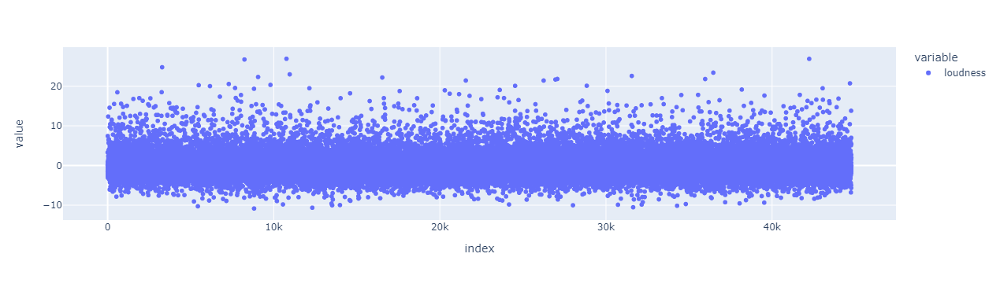

In [1493]:
from sklearn.metrics import mean_squared_error
y_pred = clf.predict(X_test)
print(mean_squared_error(y_test,y_pred))

residual = (abs(y_test) - abs(y_pred))
fig = px.scatter(residual)
fig.show()

In [1477]:
from sklearn.model_selection import GridSearchCV
parameters = {
    "kernel": ["rbf"],
    "C": [1,10,10,100,1000],
    "gamma": [1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1]
    }

grid = GridSearchCV(SVR(), parameters, cv=5, verbose=2)
grid.fit(X_train, y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] END .......................C=1, gamma=1e-08, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-08, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-08, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-08, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-08, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-07, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-07, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-07, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-07, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-07, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-06, kernel=rbf; total time=   1.5s
[CV] END .......................C=1, gamma=1e-0

GridSearchCV(cv=5, estimator=SVR(),
             param_grid={'C': [1, 10, 10, 100, 1000],
                         'gamma': [1e-08, 1e-07, 1e-06, 1e-05, 0.0001, 0.001,
                                   0.01, 0.1],
                         'kernel': ['rbf']},
             verbose=2)

MSE je : 7.1453069782496685
Grid score je : 0.8218631538733672


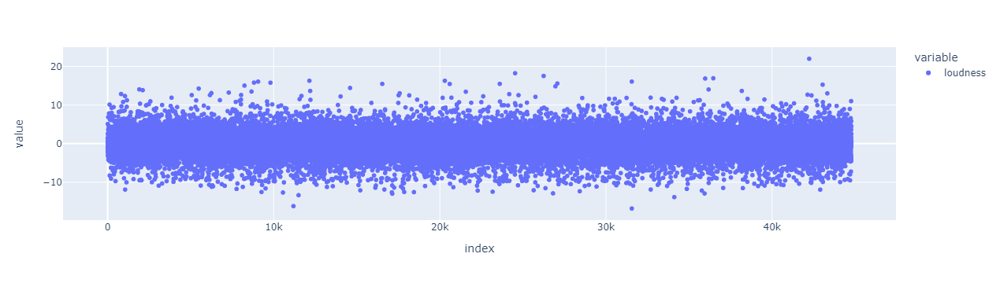

In [1495]:
y_pred = grid.predict(X_test)
print("MSE je :",mean_squared_error(y_test,y_pred))
gridScore=grid.score(X_test,y_test)
print("Grid score je :",gridScore)

# TRVA PRILIS DLHO 
# scores = cross_val_score(grid,X_test, y_test)
# print ("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() / 2))
residual = (abs(y_test) - abs(y_pred))
fig = px.scatter(residual)
fig.show()

MSE je : 4.735712200011984
Forest score je : 0.8819358163279076
Accuracy: 0.89 (+/- 0.00)


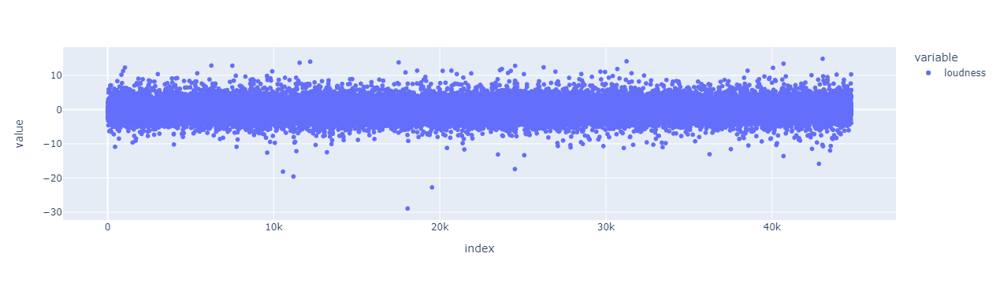

In [1496]:
from sklearn.ensemble import RandomForestRegressor
randomForest = RandomForestRegressor()
randomForest.fit(X_train,y_train)
y_pred = randomForest.predict(X_test)
print("MSE je :",mean_squared_error(y_test,y_pred))
forestScore=randomForest.score(X_test,y_test)
print("Forest score je :",forestScore)

scores = cross_val_score(randomForest,X_test, y_test)
print ("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() / 2))
residual = (abs(y_test) - abs(y_pred))
fig = px.scatter(residual)
fig.show()

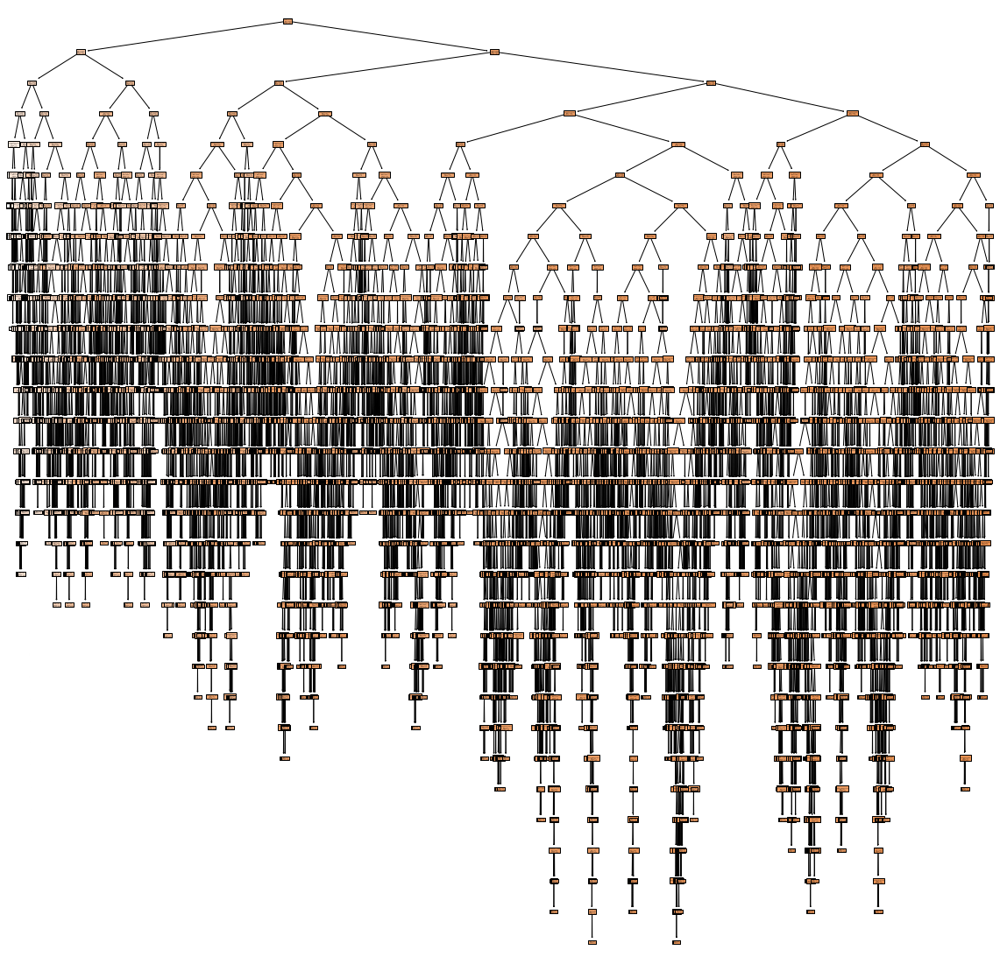

In [1480]:
from sklearn import tree
from dtreeviz.trees import dtreeviz
from matplotlib import pyplot as plt

# plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
# plt.rcParams.update({'font.size': 14})
plt.figure(figsize=(20,20))
_ = tree.plot_tree(randomForest.estimators_[0], feature_names=train_Data.columns, filled=True)
plt.savefig('tree.png')

Feature: 0, Score: 0.00653
Feature: 1, Score: 0.01966
Feature: 2, Score: 0.01018
Feature: 3, Score: 0.00021
Feature: 4, Score: 0.01111
Feature: 5, Score: 0.84939
Feature: 6, Score: 0.00459
Feature: 7, Score: 0.00092
Feature: 8, Score: 0.01084
Feature: 9, Score: 0.01027
Feature: 10, Score: 0.03013
Feature: 11, Score: 0.00836
Feature: 12, Score: 0.01018
Feature: 13, Score: 0.00845
Feature: 14, Score: 0.00899
Feature: 15, Score: 0.00035
Feature: 16, Score: 0.00634
Feature: 17, Score: 0.00025
Feature: 18, Score: 0.00000
Feature: 19, Score: 0.00041
Feature: 20, Score: 0.00019
Feature: 21, Score: 0.00031
Feature: 22, Score: 0.00013
Feature: 23, Score: 0.00101
Feature: 24, Score: 0.00019
Feature: 25, Score: 0.00057
Feature: 26, Score: 0.00042
Feature: 27, Score: 0.00000


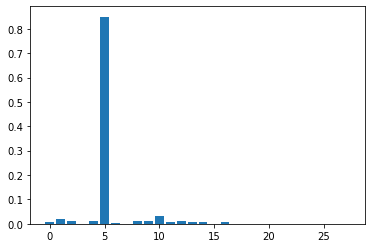

In [1481]:
importance = randomForest.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [1482]:
print(train_Data.dtypes)

popularity            int64
release_date          int64
duration_ms           int64
explicit              int64
danceability        float64
energy              float64
key                   int64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
artist_followers    float64
alternative           int64
classical             int64
country               int64
drum and bass         int64
folk                  int64
hip hop               int64
house                 int64
metal                 int64
pop                   int64
rap                   int64
rock                  int64
soul                  int64
trap                  int64
dtype: object


Mean squared error 8.162934287728456
R² score, the coefficient of determination 0.7964930864998184
Accuracy: 0.86 (+/- 0.00)


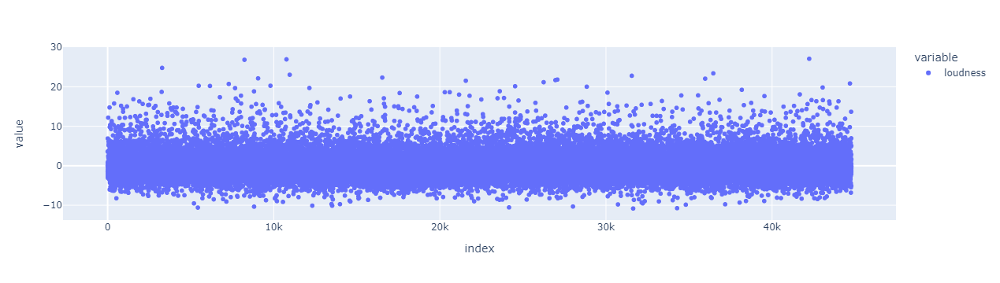

In [1497]:
# from sklearn.svm import SVR
# import matplotlib
# import matplotlib.pyplot as plt
# import sklearn.metrics as metrics
# import plotly.express as px
from sklearn.ensemble import BaggingRegressor
from sklearn.datasets import make_regression

regr = BaggingRegressor(base_estimator=SVR(), n_jobs = 2,
                        n_estimators=10, random_state=0).fit(X_train, y_train)
#Predict the response for test dataset
y_pred = regr.predict(X_test)
print("Mean squared error",metrics.mean_squared_error(y_test, y_pred))
print("R² score, the coefficient of determination",metrics.r2_score(y_test, y_pred))

scores = cross_val_score(regr,X_test, y_test)
print ("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() / 2))

residual = (abs(y_test) - abs(y_pred))
fig = px.scatter(residual)
fig.show()

Mean squared error 4.7418466856321695
R² score, the coefficient of determination 0.8817828798726488
Accuracy: 0.88 (+/- 0.00)


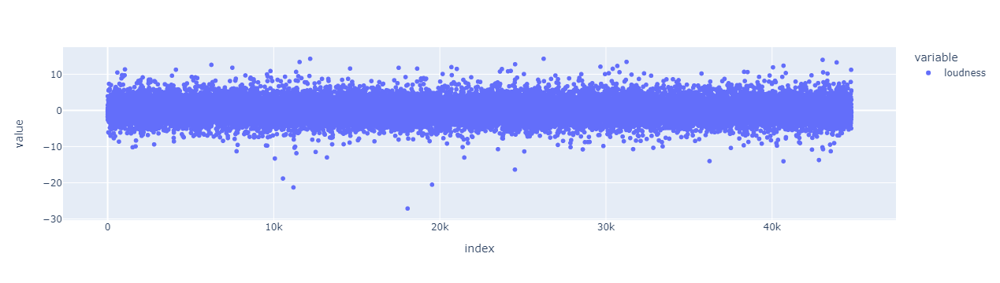

In [1498]:
from sklearn.ensemble import GradientBoostingRegressor

regr = GradientBoostingRegressor(random_state=0).fit(X_train, y_train)
y_pred = regr.predict(X_test)
print("Mean squared error",metrics.mean_squared_error(y_test, y_pred))
print("R² score, the coefficient of determination",metrics.r2_score(y_test, y_pred))

scores = cross_val_score(regr,X_test, y_test)
print ("Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() / 2))

residual = (abs(y_test) - abs(y_pred))
fig = px.scatter(residual)
fig.show()